# CTCF Screen example
This notebook shows how to examine interactions for specific motifs (or arbitrary n-length sequences) that intersect sequences in a pre-trained model. Inputs are:

- a bed file of motif coordinates
- bed file with labels for sequences the model was trained on
- model files (json and weights file)
- specific task to perform analysis on
- reference genome fasta file to extract sequences for relevant genomics coordinates

In this notebook we mutate each CTCF motif that intersects with a sequence in our trained model and rank these motifs by their total interaction with the rest of the sequence (taking only into account significant interactions based of a null model of shuffled sequences). 

In [2]:
# Imports

import os, sys
import numpy as np
import pandas as pd
import gzip

import warnings
warnings.filterwarnings('ignore')

import matplotlib
matplotlib.use('Agg') 
import matplotlib.pyplot as plt

import pickle
import itertools
import copy

from keras.models import model_from_json
from Bio import SeqIO

import dfim
import dfim.util
import dfim.core
import dfim.null_model
import dfim.plot


In [9]:
# Specify data files

DATA_DIR = 'CTCF_screen_data/'

bed_file = '/mnt/lab_data/kundaje/users/oursu/bassik/paper_2017-11-16/data/guides/sg/CTCF.sg.elements.gz'
labels_file = '/mnt/lab_data/kundaje/users/pgreens/projects/hematopoiesis/deep_learning//matrices/hema_model_jason_only_oct17_idr_K562_GM12878_CV_corePeakSize_500_totalPeakSize_1000_neg_flank_offset_500_Sequential_1D_model_binaryPeaks.txt'
genome_file = '/mnt/data/annotations/by_organism/human/hg19.GRCh37/hg19.genome.fa'

model_weights = '/users/pgreens/git/dfim/examples/binding_qtl_interaction_data/hematopoiesis_18task_model_weights.h5'
model_json = '/users/pgreens/git/dfim/examples/binding_qtl_interaction_data/hematopoiesis_18task_model_architecture.json'

# K562 DNAse is task 0 in this model, Erythroid ATAC is 10 

task = 0


In [4]:
# Load model 

model_json = open(model_json, 'r').read()
model = model_from_json(model_json)
model.load_weights(model_weights)

In [5]:
# Load sequences

reload(dfim.util)

(sequences, mutant_loc_dict) = \
    dfim.util.process_seqs_and_locations_from_bed_and_labels(bed_file, labels_file, 
                                                             genome_file,
                                                             seq_len=1000, flank_size=50)
    
print 'There are %s total sequences'%(sequences.shape[0])


There are 5671 total sequences


In [6]:
# Compute model predictions

predictions = model.predict(sequences)

In [10]:
# Keep one sequence for each mutant (highest prediction)

print 'Starting with %s mutants'%(len(mutant_loc_dict))

all_mut_names = np.unique([mutant_loc_dict[key]['mut_name'].split(';')[1] for key in mutant_loc_dict.keys()])
for mut in all_mut_names:
    mut_seqs = [(key, mutant_loc_dict[key]['seq'], predictions[mutant_loc_dict[key]['seq'], task]) 
                            for key in mutant_loc_dict.keys()
                                if mut in mutant_loc_dict[key]['mut_name']]
    if len(mut_seqs) > 1:
        best_pred = np.max([el[1] for el in mut_seqs])
        remove_keys = [el[0] for el in mut_seqs if el[1] != best_pred]
        for r_key in remove_keys:
            del mutant_loc_dict[r_key]

print 'Left with %s mutants'%(len(mutant_loc_dict))


Starting with 5671 mutants
Left with 4331 mutants


In [11]:
# Specify index to compute over
compute_index = [mutant_loc_dict[key]['seq'] for key in mutant_loc_dict.keys()]
print(len(compute_index))



4331


In [12]:
### COMPUTE DFIM

# Generate mutated sequences and a key that specifies the index of each 
# of the sequence and which mutation is present there
reload(dfim.core)
(mutated_seq_array, mutated_seq_key) = \
            dfim.core.generate_mutants_and_key(sequences, 
                                               mut_loc_dict=mutant_loc_dict,
                                               sequence_index=compute_index,
                                               per_base_map=False,
                                               mutant_gc_fraction=0.46)

# Look at how these mutations change the model's predictions
mutated_seq_preds = model.predict(mutated_seq_array)

# Compute importance scores for original and mutated sequences
score_dict = dfim.core.compute_importance(model, mutated_seq_array, 
                                          tasks=[task],
                                          score_type='deeplift',
                                          find_scores_layer_idx=0,
                                          target_layer_idx=-2,
                                          reference_gc=None,
                                          reference_shuffle_type='dinuc')

# Compute the change in importance scores as a result of each mutation
delta_dict = dfim.core.compute_delta_profiles(score_dict, mutated_seq_key, 
                                              mutant_loc_dict, [task], 
                                              compute_index, 
                                              mutated_seq_preds)




Generating mutated sequences
Calculating Importance Scores
nonlinear_mxts_mode is set to: DeepLIFT_GenomicsDefault
For layer 2 the preceding linear layer is 0 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Heads-up: current implementation assumes maxpool layer is followed by a linear transformation (conv/dense layer)
For layer 6 the preceding linear layer is 4 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Heads-up: current implementation assumes maxpool layer is followed by a linear transformation (conv/dense layer)
For layer 10 the preceding linear layer is 8 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Heads-up: current implementation assumes maxpool layer is followed by a linear transformation (conv/dense layer)
For layer 15 the preceding li

In [13]:
### Compute DFIM on shuffled sequences

# Shuffle sequences
shuf_sequences = dfim.null_model.shuffle_seq_from_one_hot(sequences, dinuc=False)

(shuf_mutated_seq_array, shuf_mutated_seq_key) = \
            dfim.core.generate_mutants_and_key(shuf_sequences, 
                                               mut_loc_dict=mutant_loc_dict,
                                               sequence_index=compute_index,
                                               per_base_map=False,
                                               mutant_gc_fraction=0.46)

# Look at how these mutations change the model's predictions
shuf_mutated_seq_preds = model.predict(shuf_mutated_seq_array)

# Compute importance scores for original and mutated sequences
shuf_score_dict = dfim.core.compute_importance(model, shuf_mutated_seq_array, 
                                          tasks=[task],
                                          score_type='deeplift',
                                          find_scores_layer_idx=0,
                                          target_layer_idx=-2,
                                          reference_gc=0,
                                          reference_shuffle_type='dinuc')

# Compute the change in importance scores as a result of each mutation
shuf_delta_dict = dfim.core.compute_delta_profiles(shuf_score_dict, shuf_mutated_seq_key, 
                                                   mutant_loc_dict, [task], 
                                                   compute_index, 
                                                   shuf_mutated_seq_preds)



Using random shuffle
Generating mutated sequences
Calculating Importance Scores
nonlinear_mxts_mode is set to: DeepLIFT_GenomicsDefault
For layer 2 the preceding linear layer is 0 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Heads-up: current implementation assumes maxpool layer is followed by a linear transformation (conv/dense layer)
For layer 6 the preceding linear layer is 4 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Heads-up: current implementation assumes maxpool layer is followed by a linear transformation (conv/dense layer)
For layer 10 the preceding linear layer is 8 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
Heads-up: current implementation assumes maxpool layer is followed by a linear transformation (conv/dense layer)
For laye

In [14]:
### Generate maps

reload(dfim.core)

dfim_dict = dfim.core.compute_dfim(delta_dict, compute_index, [task],
                                   operations=[np.max], 
                                   operation_axes=[-1],
                                   absolute_value=True, annotate=False, 
                                   mutated_seq_key=mutated_seq_key,
                                   per_base_map=False)

shuf_dfim_dict = dfim.core.compute_dfim(shuf_delta_dict, compute_index, [task],
                                        operations=[np.max], 
                                        operation_axes=[-1],
                                        absolute_value=True, annotate=False, 
                                        mutated_seq_key=shuf_mutated_seq_key,
                                        per_base_map=False)


In [15]:
### Compute p-values from shuffled sequences

reload(dfim.null_model)
dfim_pval_dict = dfim.null_model.assign_pval(dfim_dict, 
                                             shuf_dfim_dict,
                                             null_level = 'per_task',
                                             null_type = 'fit')




In [16]:
### Rank by most significant interactions
### Returns sorted list of (task, seq, mut) pairs 

reload(dfim.util)
# top_rankings = dfim.util.rank_by_min_pval(dfim_pval_dict)
top_rankings = dfim.util.rank_by_max_total_interaction(dfim_dict, dfim_pval_dict=dfim_pval_dict)

In [17]:
### Write out the rankings

rank_df = pd.DataFrame(index=range(len(top_rankings)),
                       columns=['region', 'mutant', 
                                'sum_abs_interaction', 'max_abs_interaction',
                                'num_sig_interaction',
                                'model_prediction'])

ind=0
for (task, seq, mut) in [el[0] for el in top_rankings]:
    mut_name = mutant_loc_dict['seq_%s'%seq]['mut_name']
    sum_score = np.sum(dfim_dict[task][seq][mut] * (dfim_pval_dict[task][seq][mut] < 0.05))
    max_score = np.max(dfim_dict[task][seq][mut] * (dfim_pval_dict[task][seq][mut] < 0.05))
    num_sig = (dfim_pval_dict[task][seq][mut] < 0.05).sum()
    region = mut_name.split(';')[0]
    mut = mut_name.split(';')[1]
    rank_df.iloc[ind, :] = {
        'region': region,
        'mutant': mut,
        'sum_abs_interaction': sum_score, 
        'max_abs_interaction': max_score,
        'num_sig_interaction': num_sig,
        'model_prediction': predictions[seq, task]
    }
    ind+=1


In [18]:
print rank_df.shape
print rank_df.head(n=20)
rank_df.sort_values(by='sum_abs_interaction', inplace=True)
rank_df.to_csv('/mnt/lab_data/kundaje/users/pgreens/projects/ctcf_screen/ctcf_mutants_ranked_by_total_interaction.txt', sep="\t", header=True, index=False)

(4331, 6)
                       region                      mutant sum_abs_interaction  \
0   chr11:111983776-111984776  mut_111984329_to_111984349              4.2844   
1      chr1:14154926-14155926    mut_14155515_to_14155535             4.15796   
2        chr7:1209252-1210252      mut_1209683_to_1209703             4.09159   
3     chr22:45831268-45832268    mut_45831730_to_45831750             3.94479   
4      chr7:99729949-99730949    mut_99730419_to_99730439             3.94014   
5       chr18:9516234-9517234      mut_9516623_to_9516643             3.92077   
6    chr1:206781128-206782128  mut_206781638_to_206781658             3.78434   
7    chr1:116903127-116904127  mut_116903576_to_116903596             3.65188   
8      chr2:71098309-71099309    mut_71098794_to_71098814               3.651   
9     chr15:40566587-40567587    mut_40567082_to_40567102             3.63095   
10    chr18:77288559-77289559    mut_77288973_to_77288993             3.56296   
11    chr19:366612

chr11:111983776-111984776;mut_111984329_to_111984349


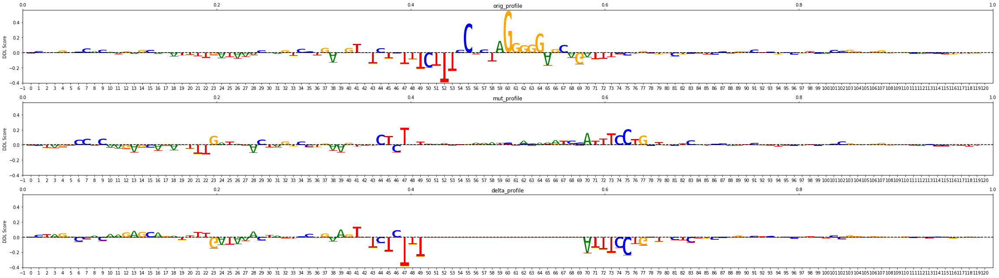

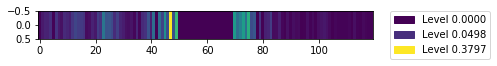

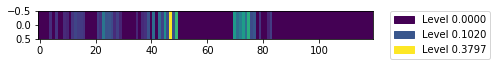

chr1:14154926-14155926;mut_14155515_to_14155535


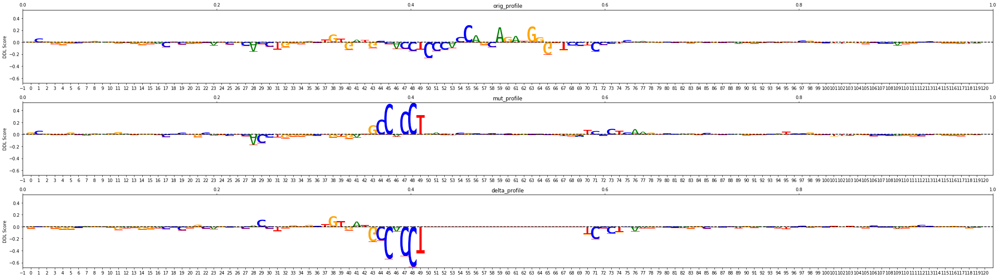

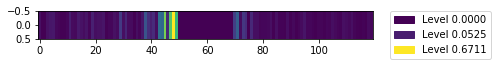

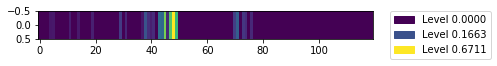

chr7:1209252-1210252;mut_1209683_to_1209703


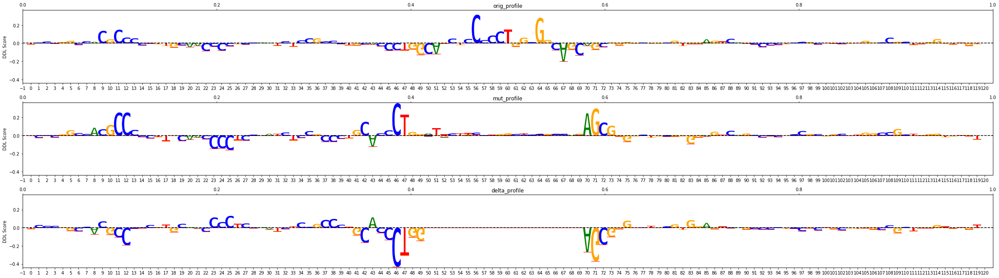

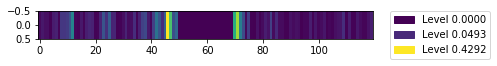

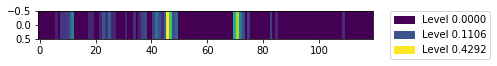

chr22:45831268-45832268;mut_45831730_to_45831750


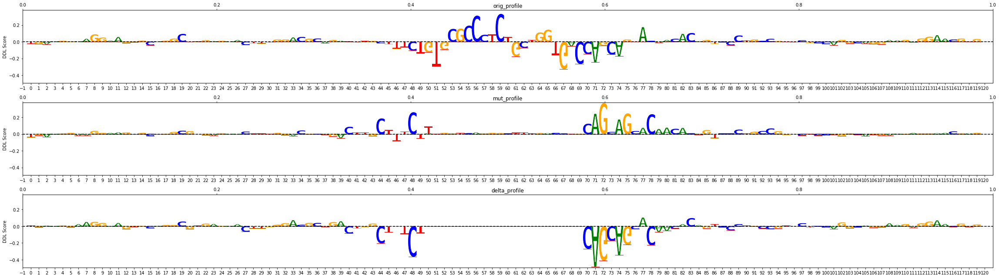

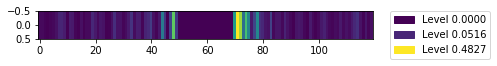

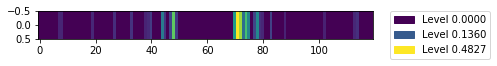

chr7:99729949-99730949;mut_99730419_to_99730439


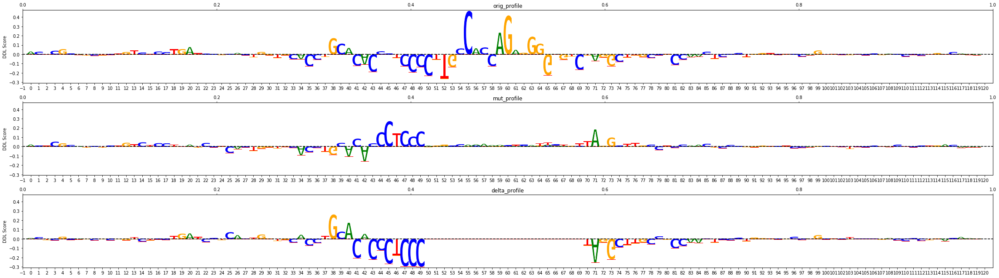

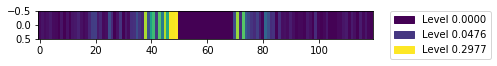

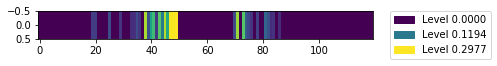

chr18:9516234-9517234;mut_9516623_to_9516643


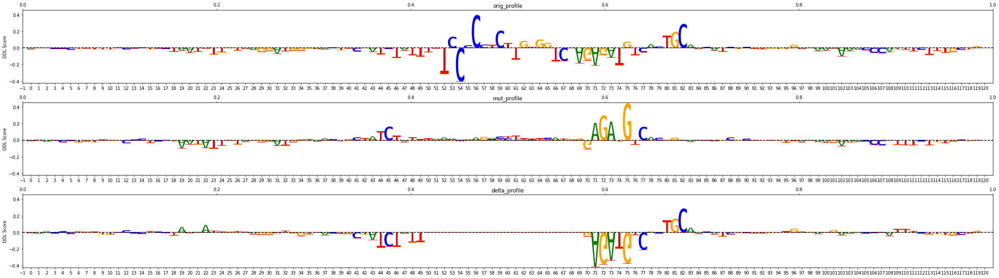

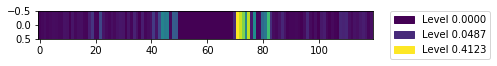

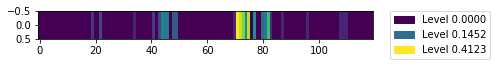

chr1:206781128-206782128;mut_206781638_to_206781658


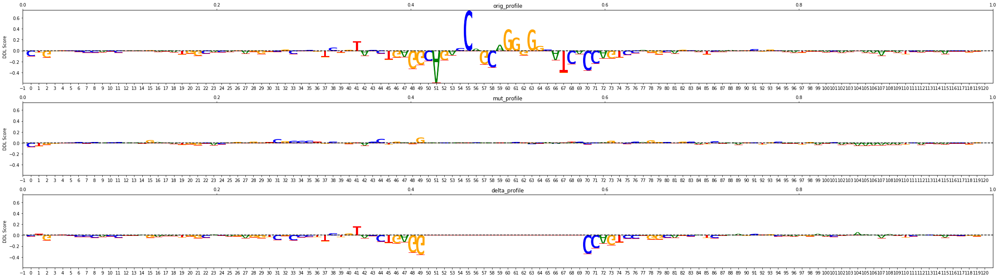

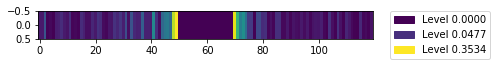

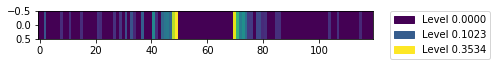

chr1:116903127-116904127;mut_116903576_to_116903596


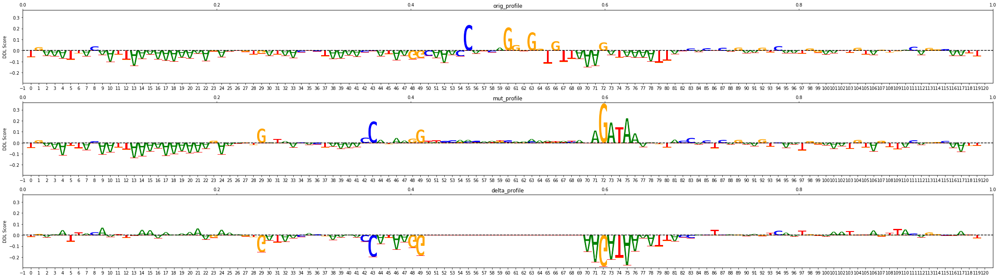

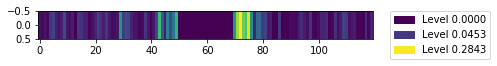

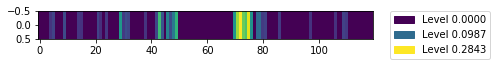

chr2:71098309-71099309;mut_71098794_to_71098814


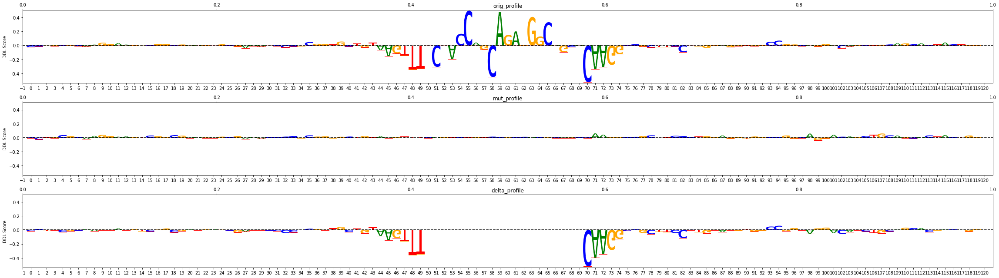

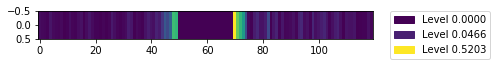

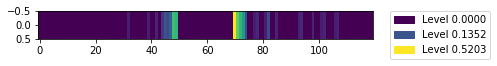

chr15:40566587-40567587;mut_40567082_to_40567102


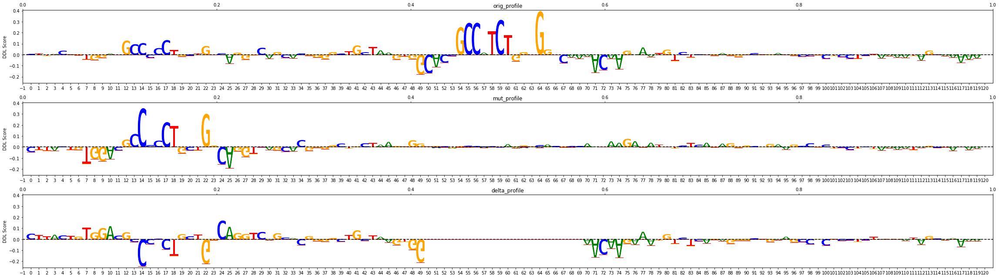

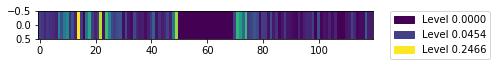

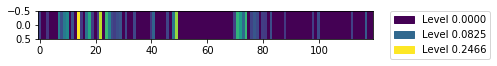

chr18:77288559-77289559;mut_77288973_to_77288993


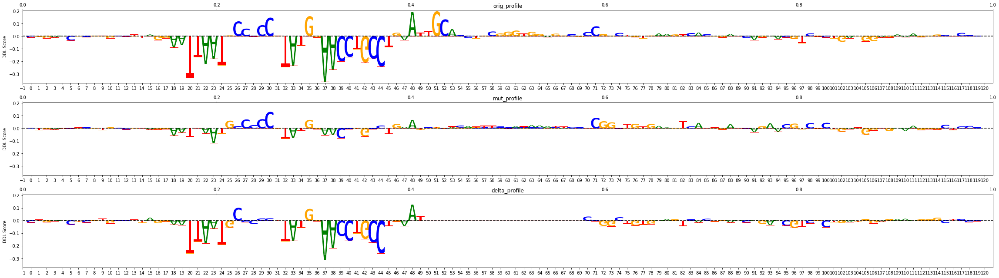

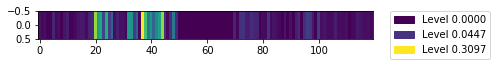

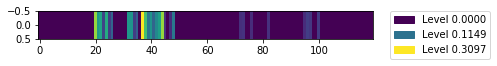

chr19:36661264-36662264;mut_36661794_to_36661814


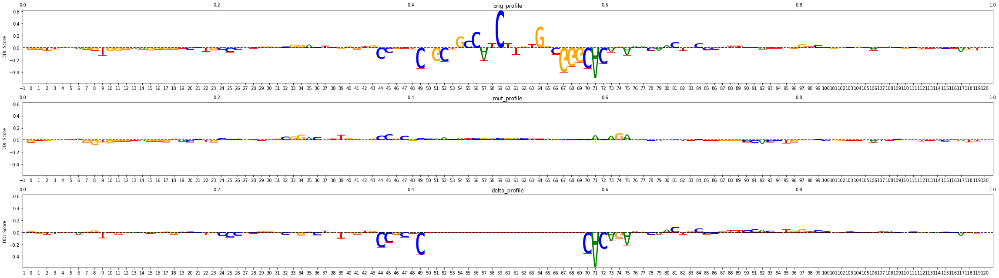

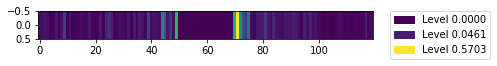

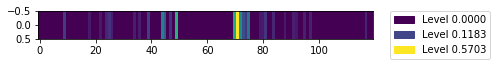

chr3:99787367-99788367;mut_99787778_to_99787798


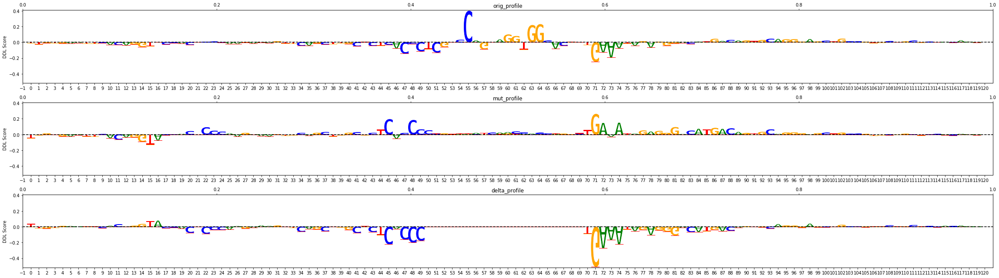

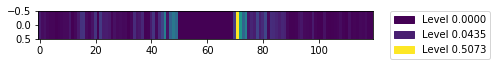

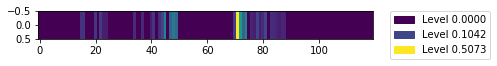

chr22:25858123-25859123;mut_25858673_to_25858693


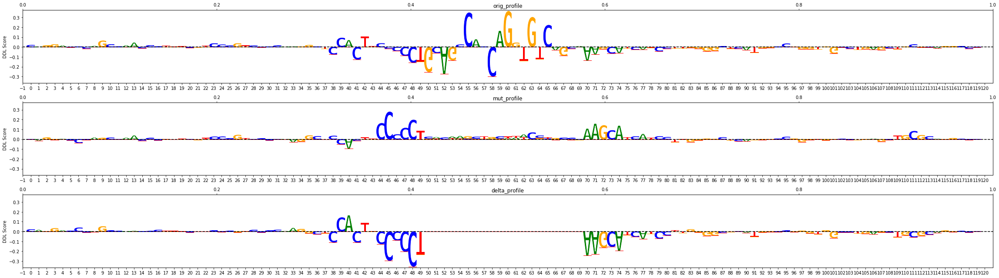

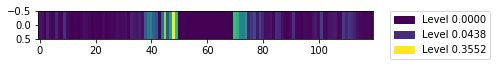

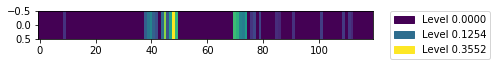

chr7:28059610-28060610;mut_28060133_to_28060153


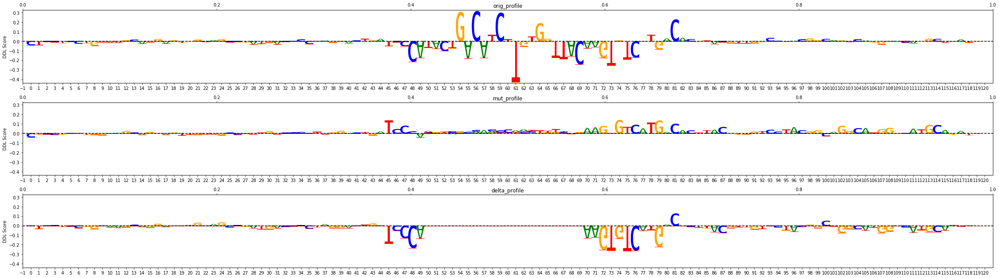

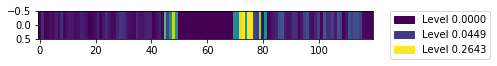

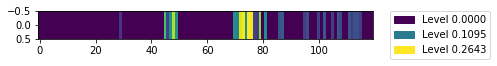

chr10:98969879-98970879;mut_98970425_to_98970445


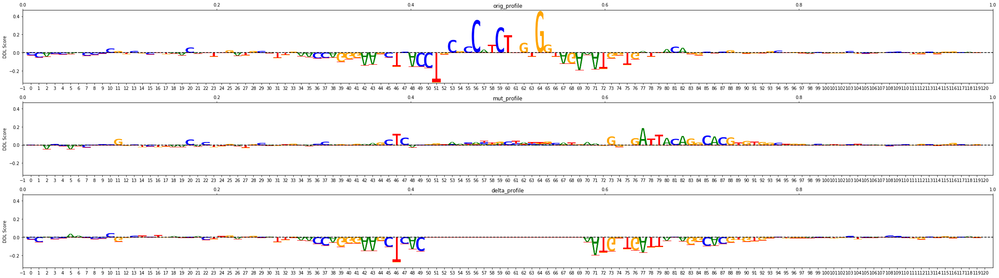

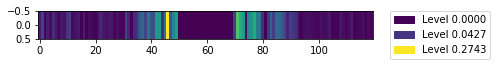

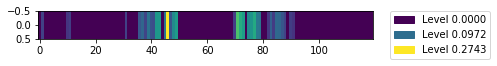

chr11:94802544-94803544;mut_94803011_to_94803031


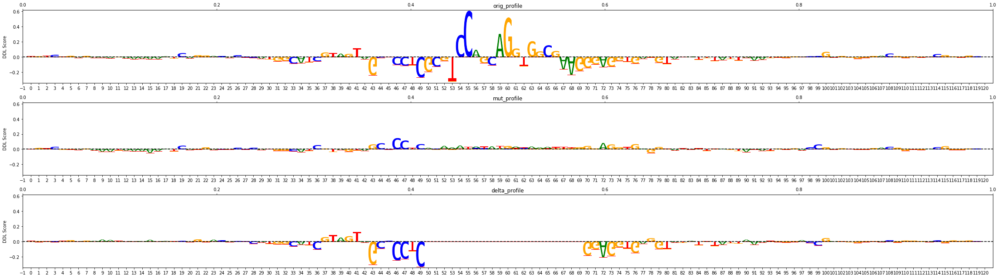

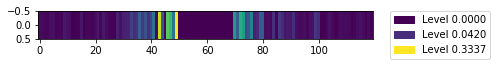

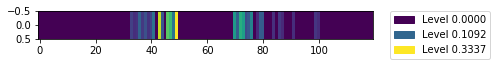

chr16:66517343-66518343;mut_66517800_to_66517820


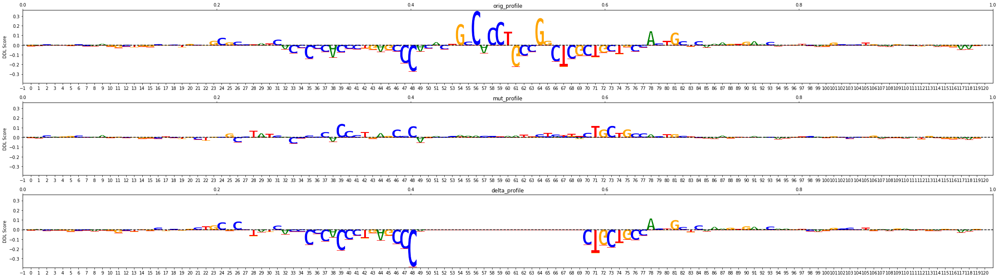

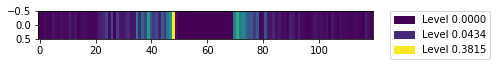

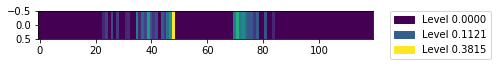

chr4:38180944-38181944;mut_38181447_to_38181467


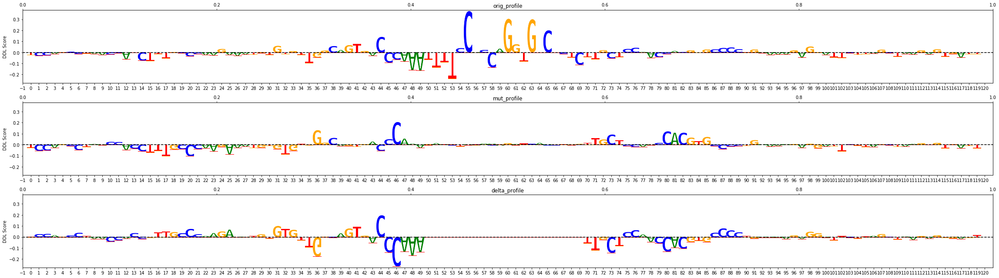

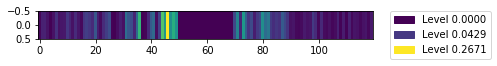

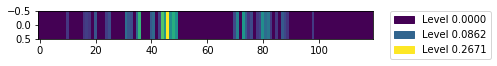

chr14:61028559-61029559;mut_61029015_to_61029035


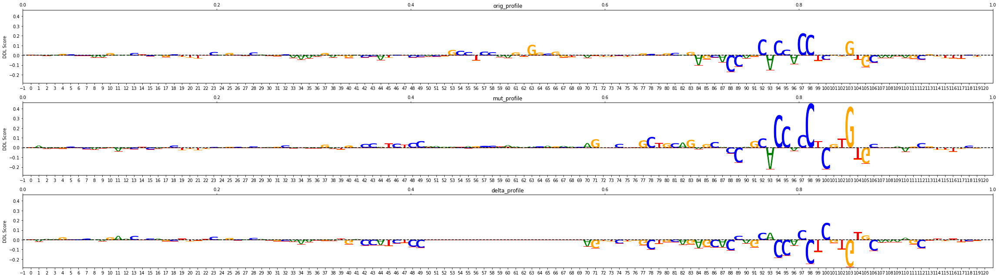

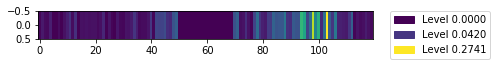

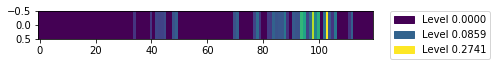

chr12:50449429-50450429;mut_50449937_to_50449957


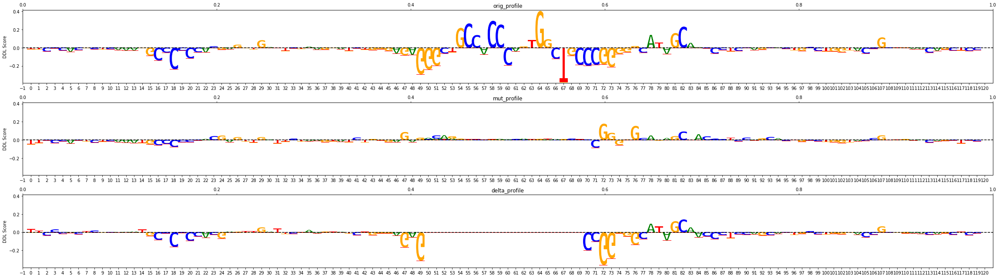

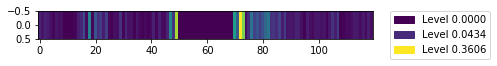

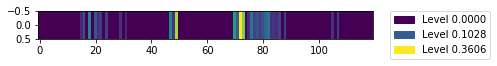

chr5:178920686-178921686;mut_178921223_to_178921243


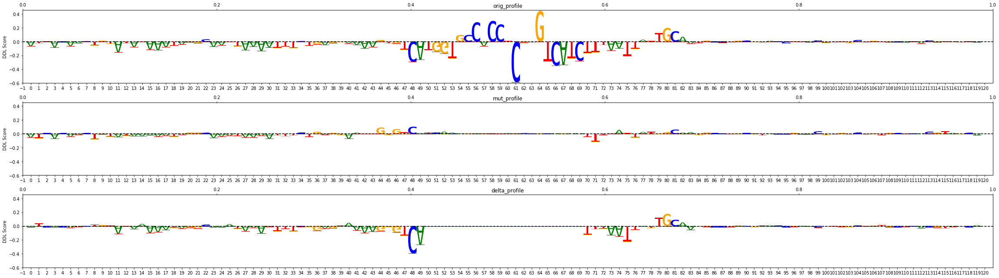

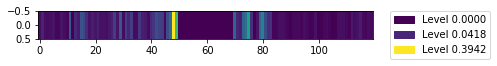

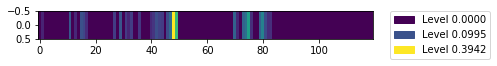

chr11:65651785-65652785;mut_65652278_to_65652298


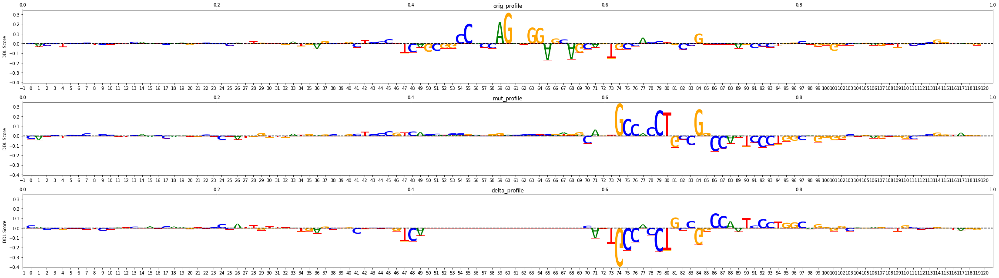

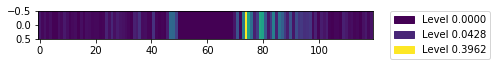

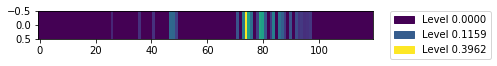

chrX:37684226-37685226;mut_37684668_to_37684688


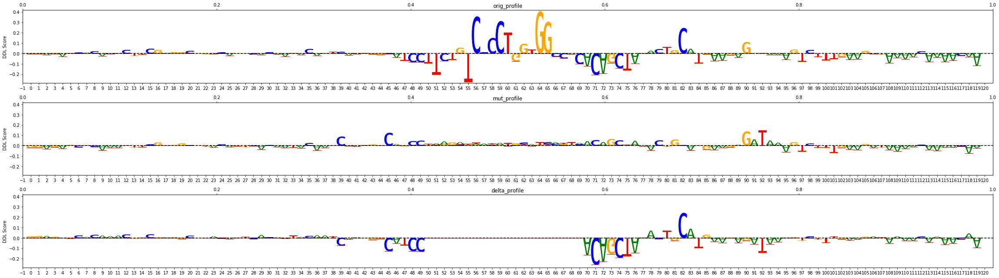

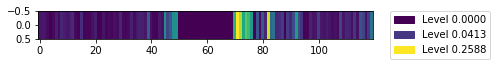

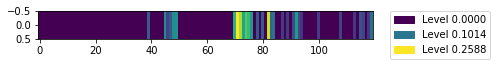

chr6:51214811-51215811;mut_51215292_to_51215312


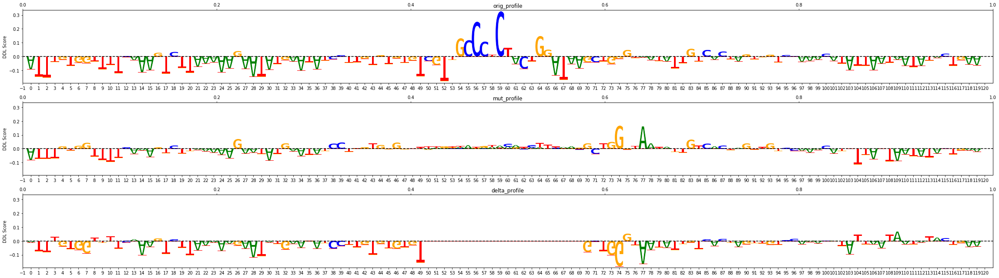

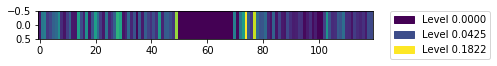

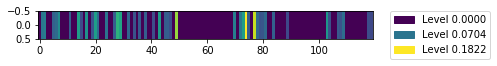

chr2:74476969-74477969;mut_74477446_to_74477515


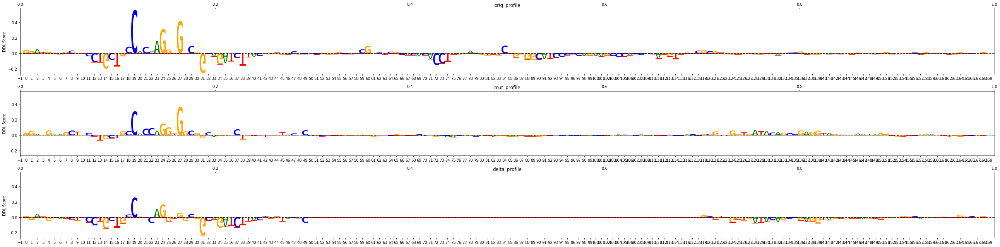

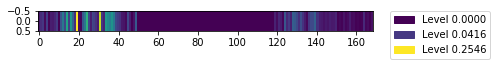

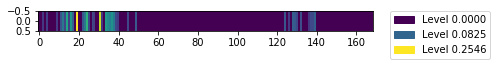

chr17:7039234-7040234;mut_7039737_to_7039757


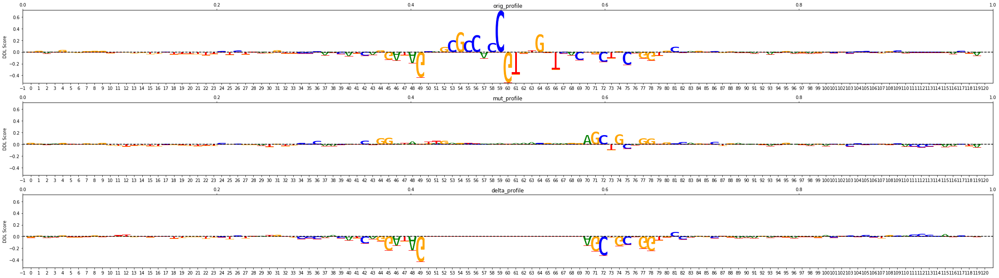

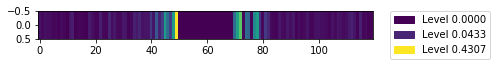

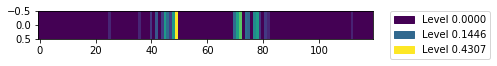

chr13:76269591-76270591;mut_76270131_to_76270151


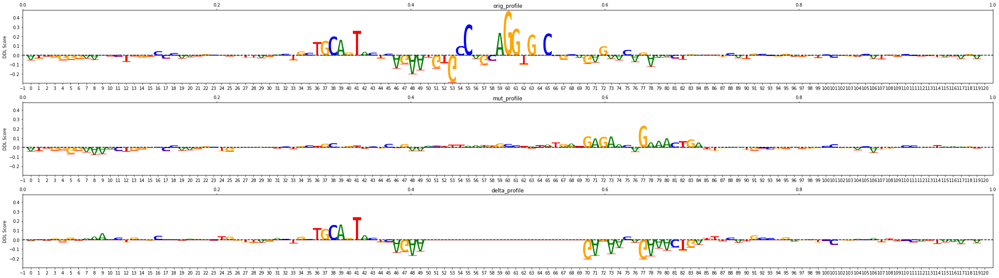

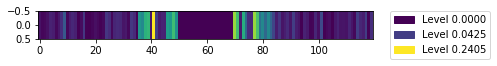

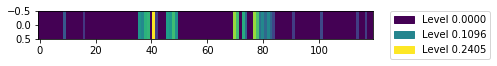

chr1:234634593-234635593;mut_234634980_to_234635000


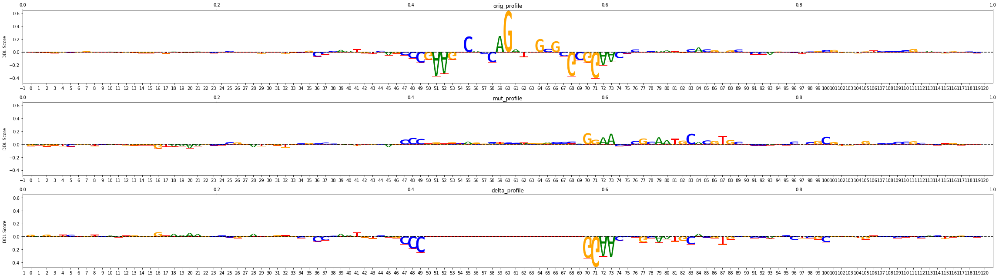

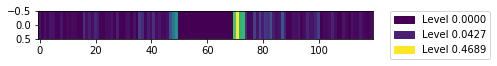

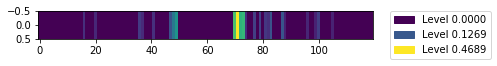

chr17:56076516-56077516;mut_56077034_to_56077054


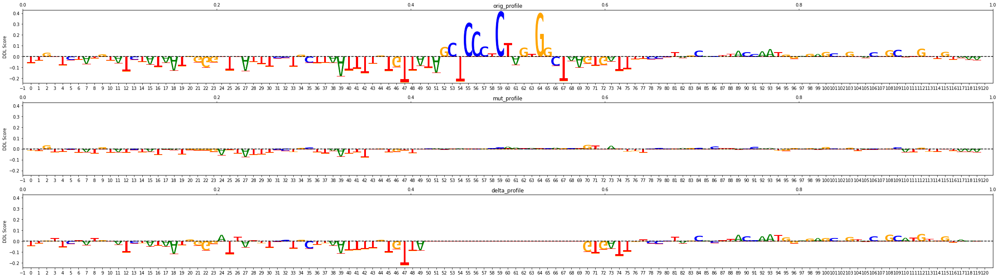

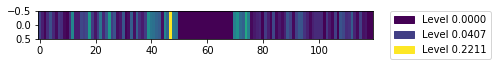

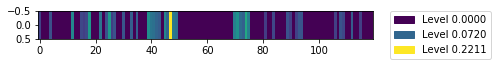

chr16:20860940-20861940;mut_20861369_to_20861389


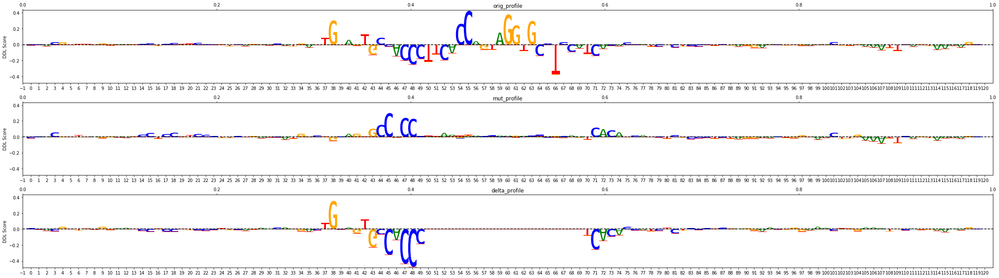

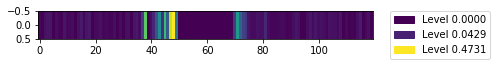

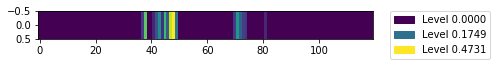

chr17:75082313-75083313;mut_75082755_to_75082775


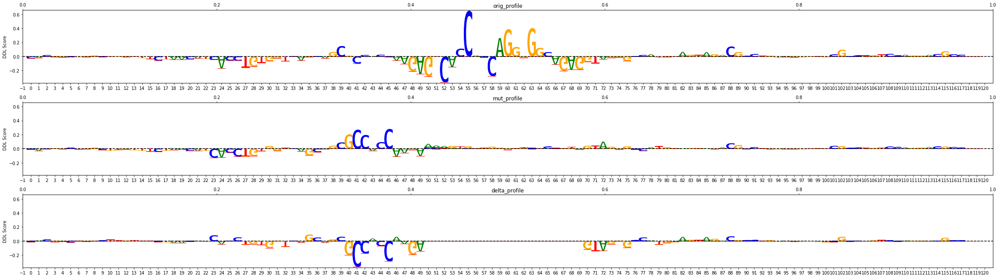

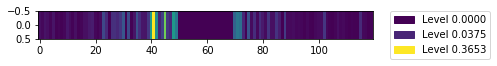

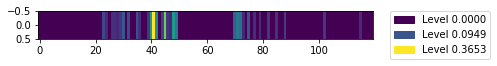

chr7:73980770-73981770;mut_73981264_to_73981284


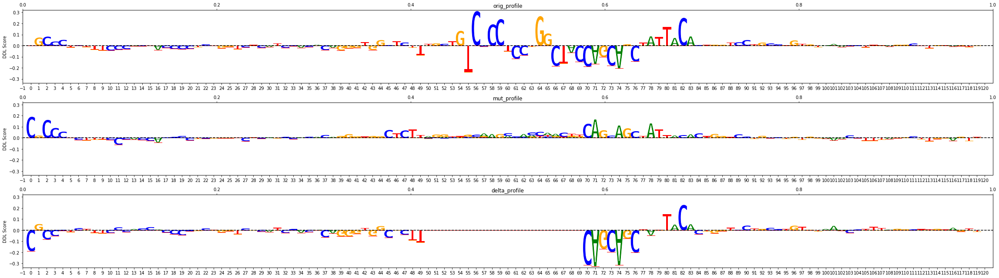

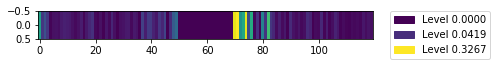

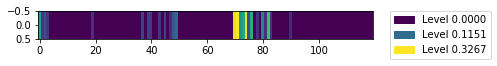

chr20:43313464-43314464;mut_43313994_to_43314014


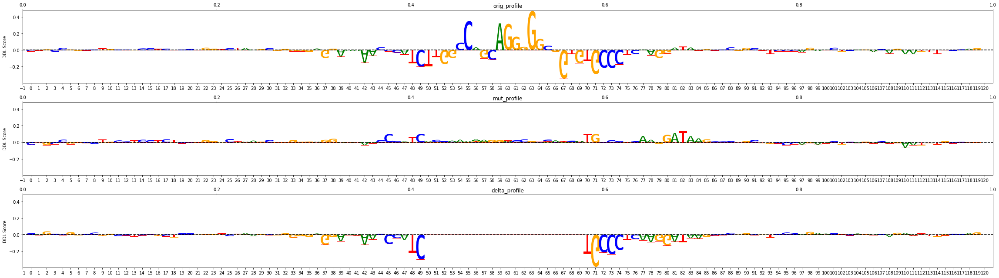

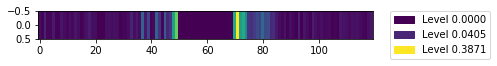

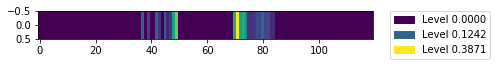

chr21:33973062-33974062;mut_33973491_to_33973511


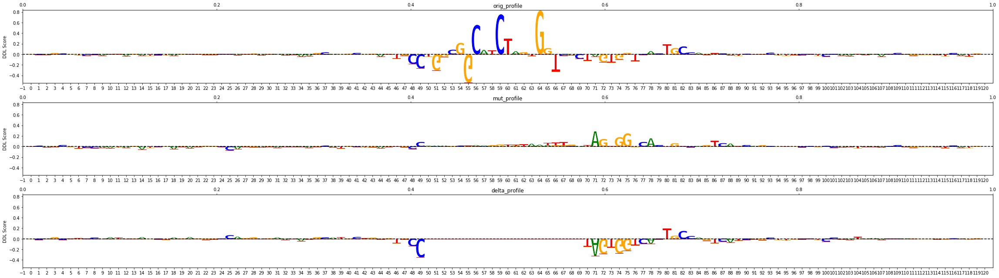

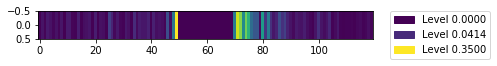

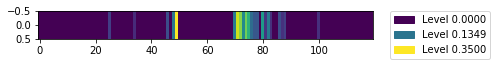

chr22:36865958-36866958;mut_36866464_to_36866484


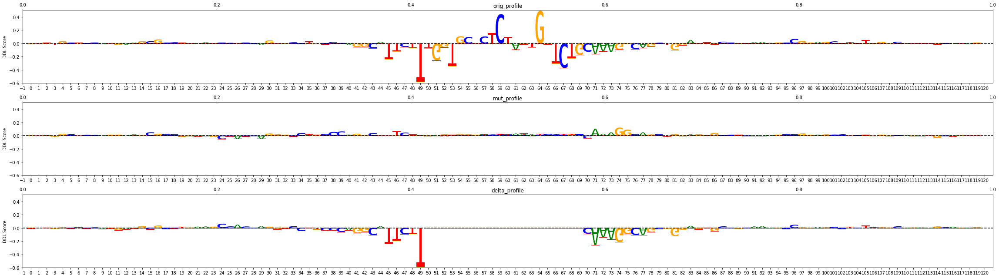

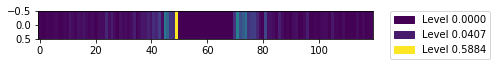

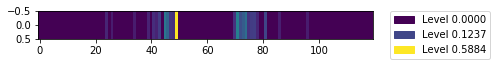

chr16:2190220-2191220;mut_2190759_to_2190779


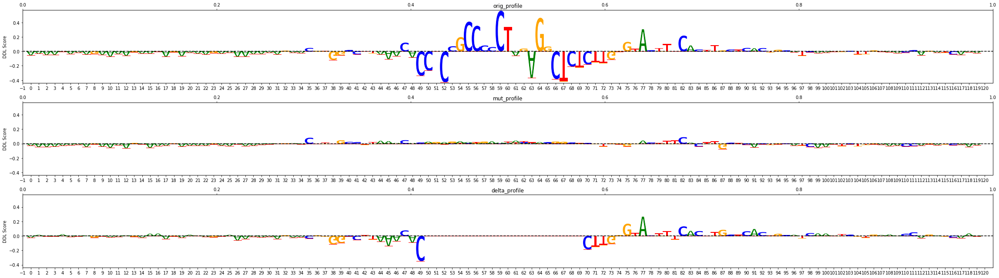

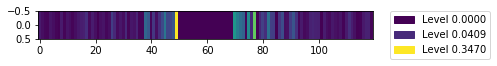

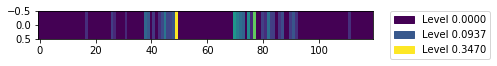

chr4:40327191-40328191;mut_40327615_to_40327635


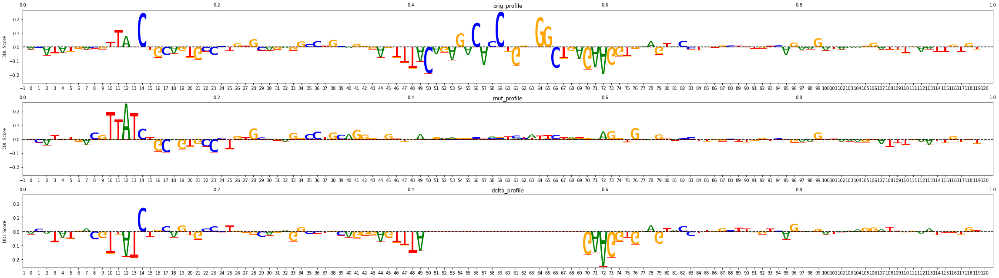

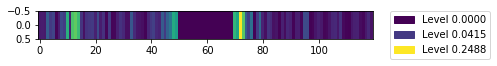

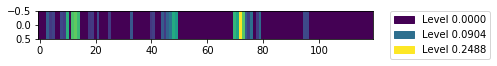

chr1:110596040-110597040;mut_110596622_to_110596642


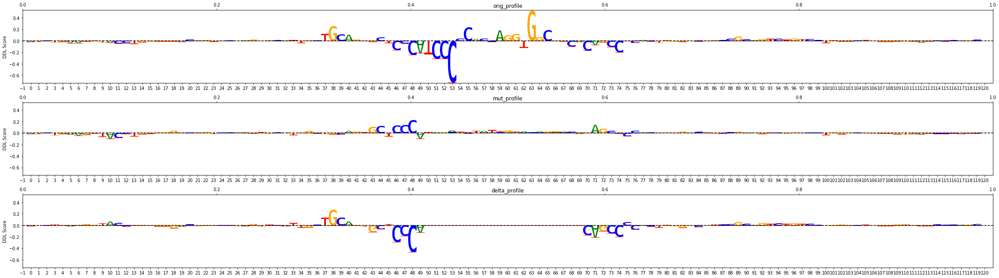

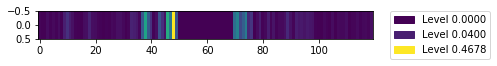

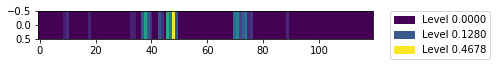

chr19:14459015-14460015;mut_14459451_to_14459471


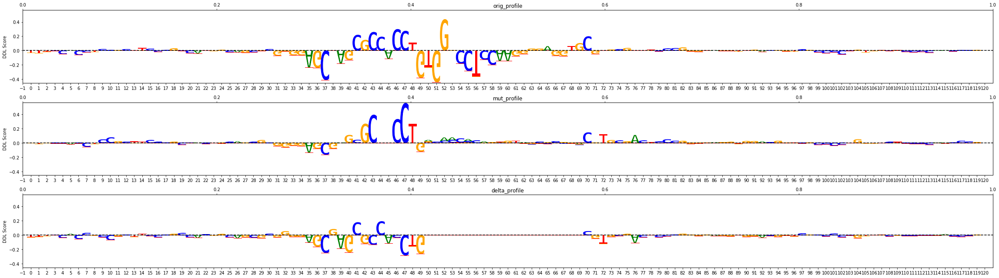

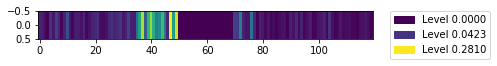

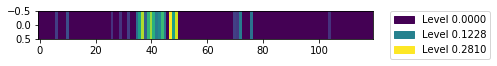

chr3:49576825-49577825;mut_49577252_to_49577272


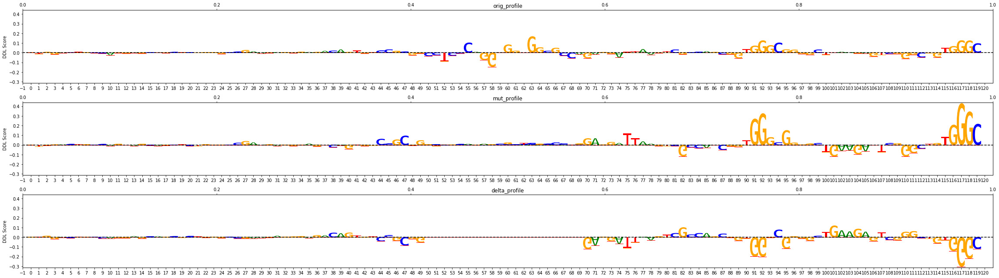

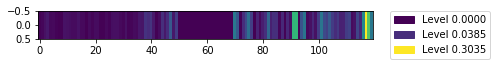

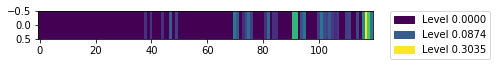

chr9:138235423-138236423;mut_138235975_to_138235995


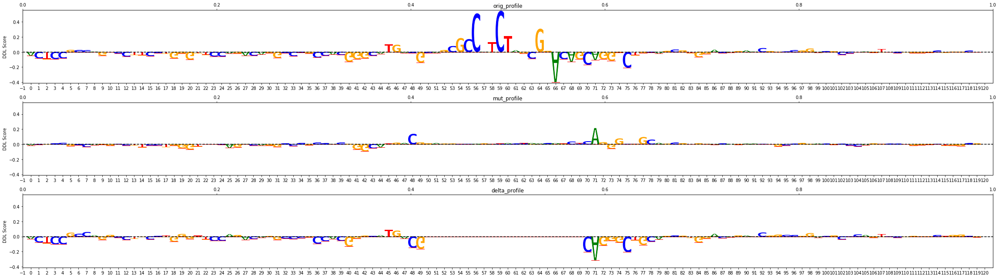

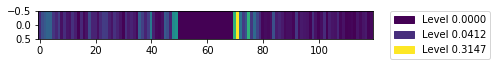

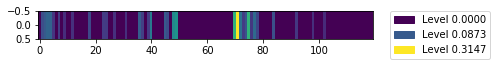

chr17:4784960-4785960;mut_4785454_to_4785473


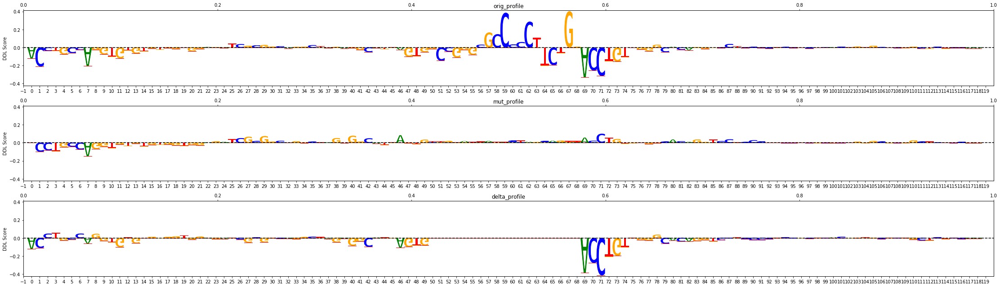

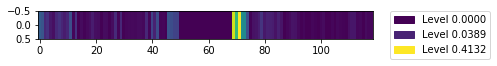

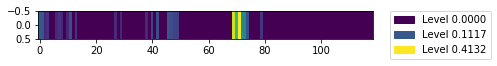

chr20:46249512-46250512;mut_46250099_to_46250119


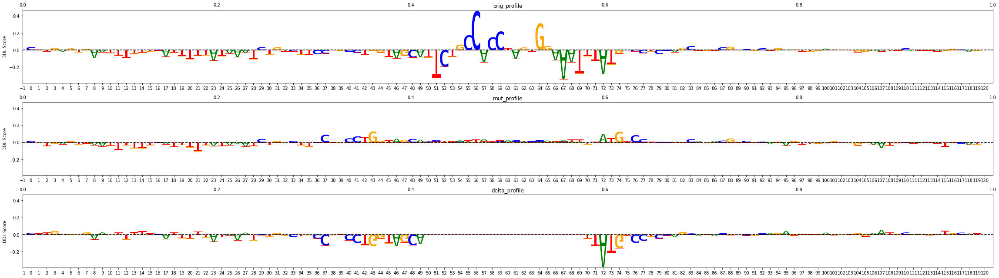

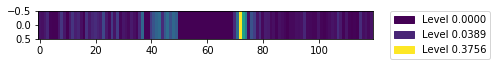

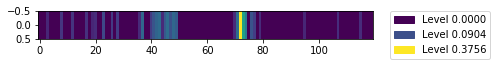

chr19:10110498-10111498;mut_10111083_to_10111103


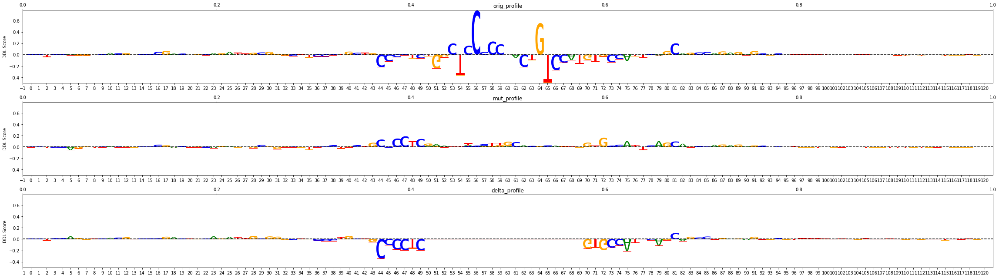

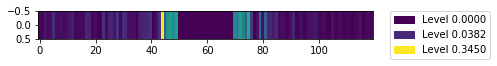

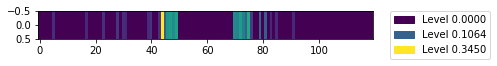

chr5:42583001-42584001;mut_42583547_to_42583567


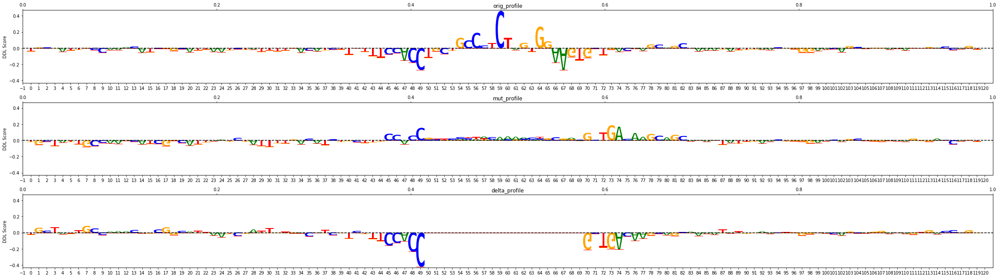

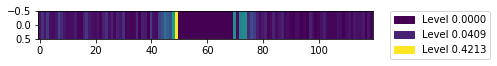

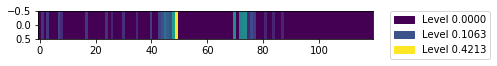

chr16:84220259-84221259;mut_84220723_to_84220743


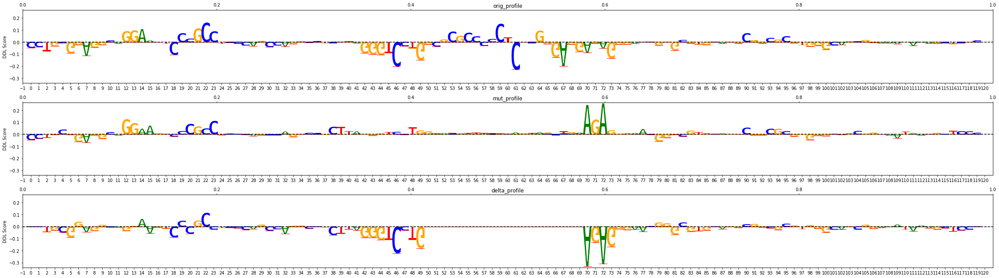

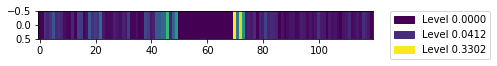

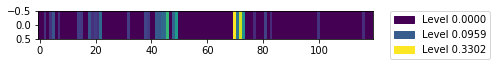

chr4:38732478-38733478;mut_38732923_to_38732943


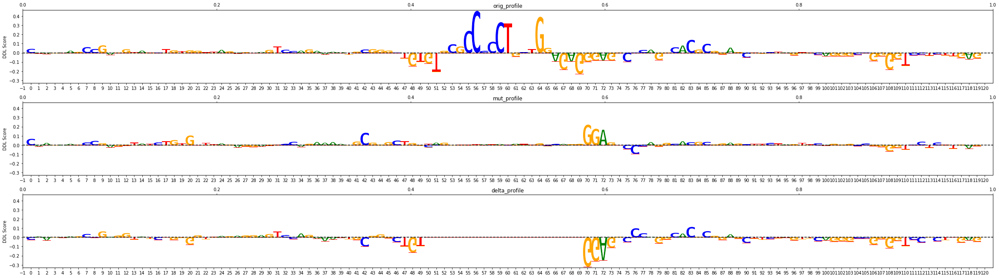

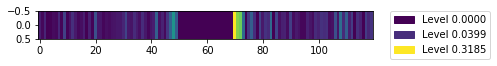

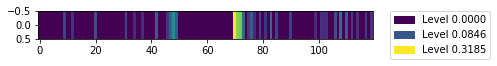

chr2:170784690-170785690;mut_170785094_to_170785114


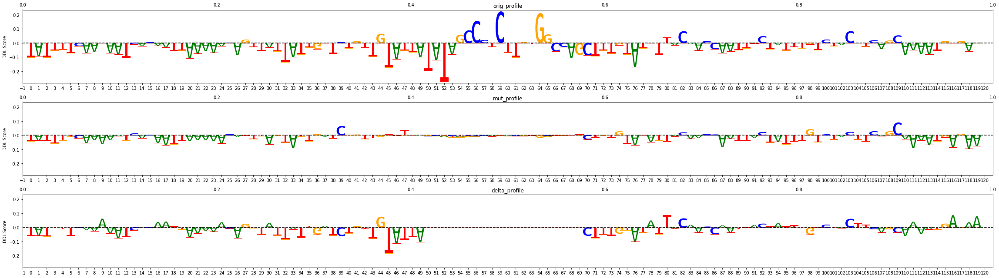

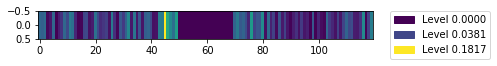

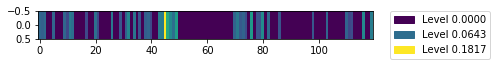

chr2:219156822-219157822;mut_219157317_to_219157337


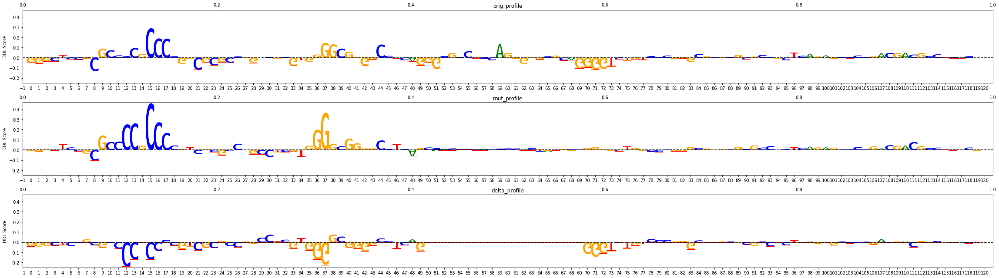

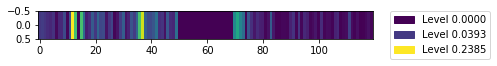

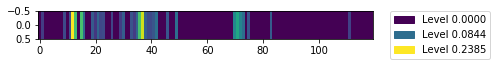

chr5:58469750-58470750;mut_58470248_to_58470268


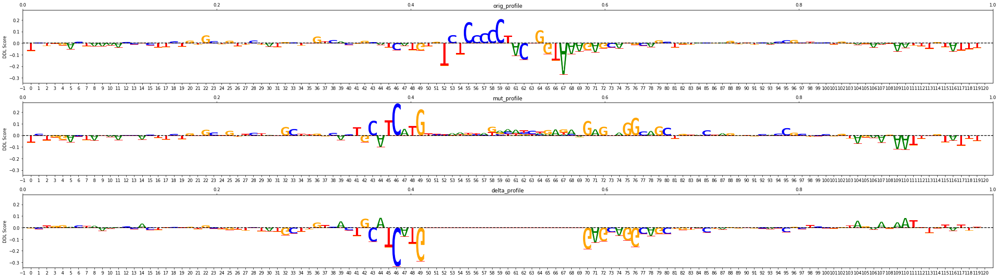

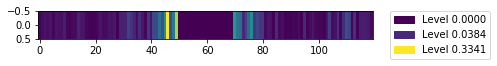

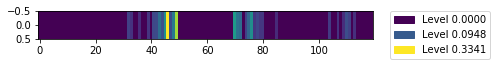

chr6:11068932-11069932;mut_11069367_to_11069387


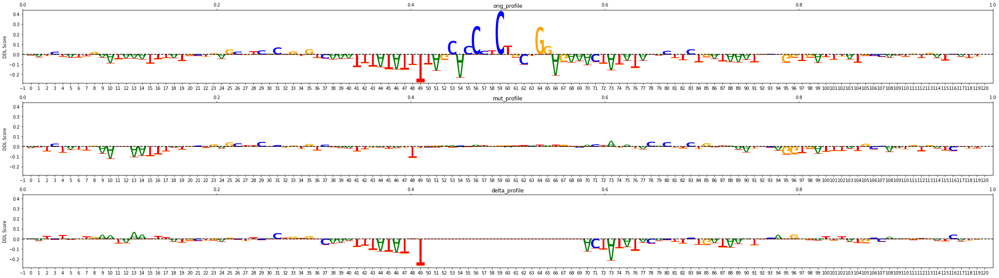

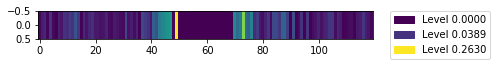

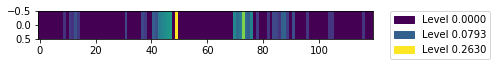

chr10:73044566-73045566;mut_73044995_to_73045015


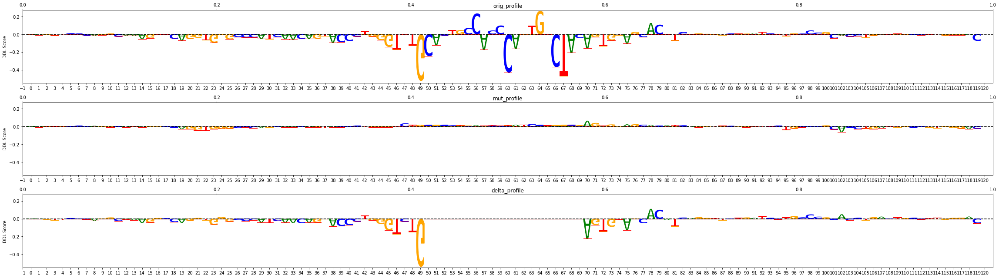

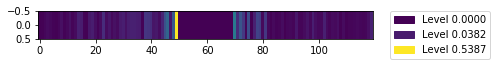

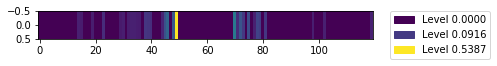

chr14:94502668-94503668;mut_94503079_to_94503099


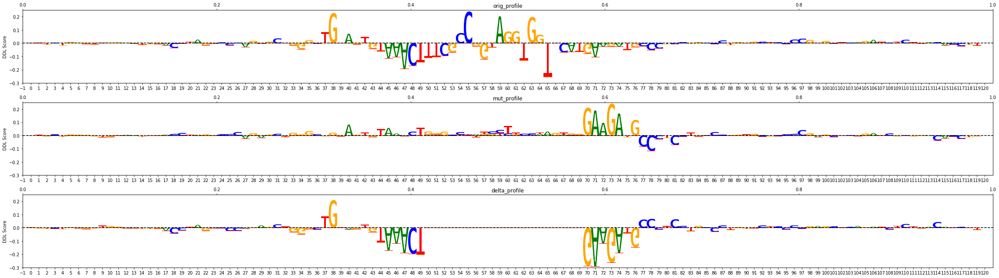

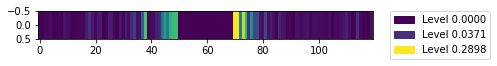

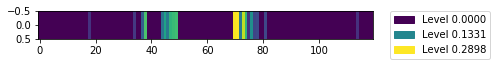

chr1:108667858-108668858;mut_108668331_to_108668351


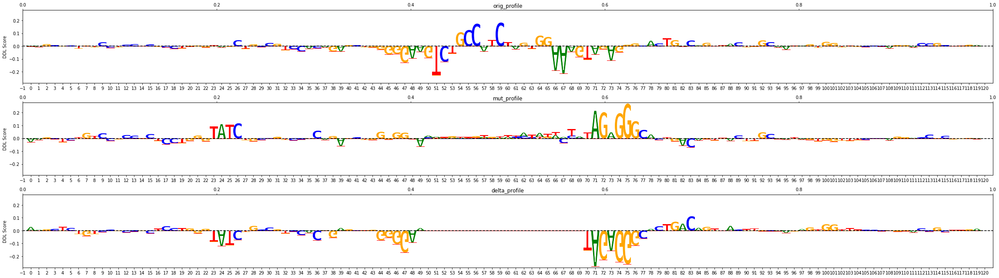

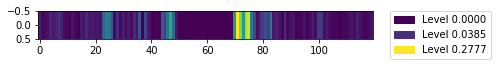

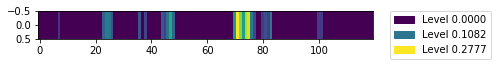

chr7:147961734-147962734;mut_147962237_to_147962257


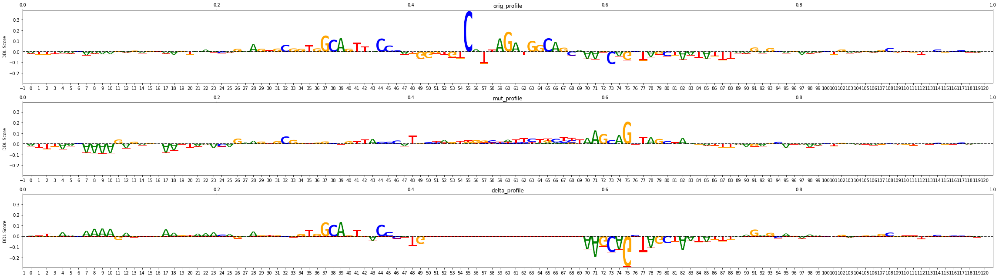

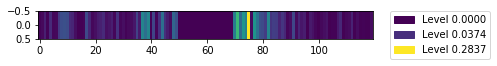

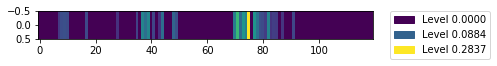

chr2:219712137-219713137;mut_219712598_to_219712618


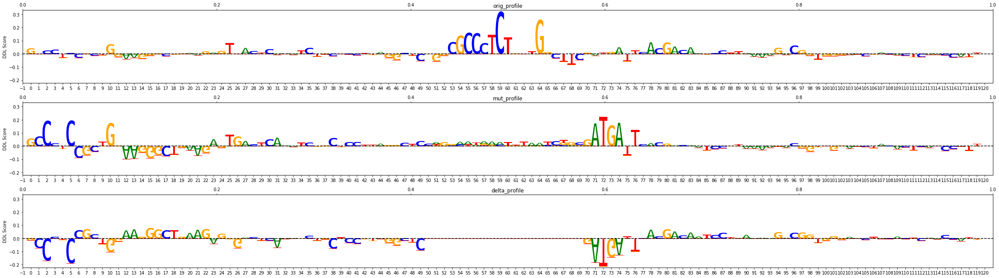

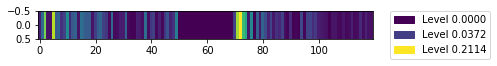

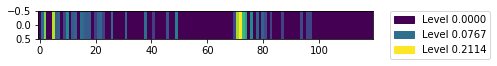

chr2:55944944-55945944;mut_55945535_to_55945565


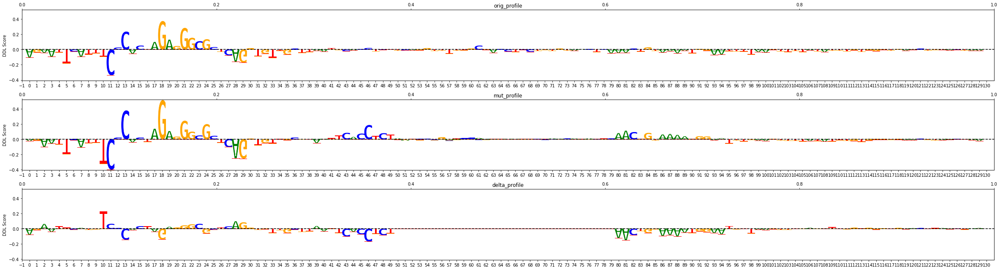

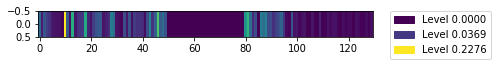

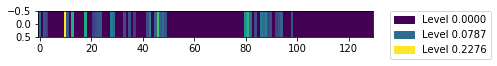

chr1:29523649-29524649;mut_29524211_to_29524231


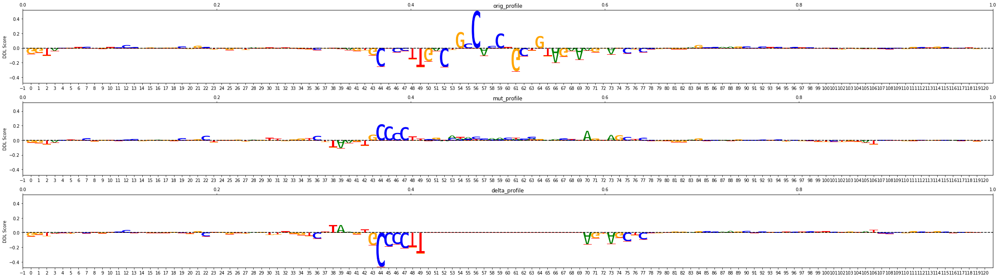

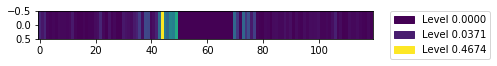

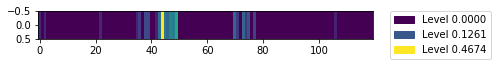

chr7:140352867-140353867;mut_140353389_to_140353409


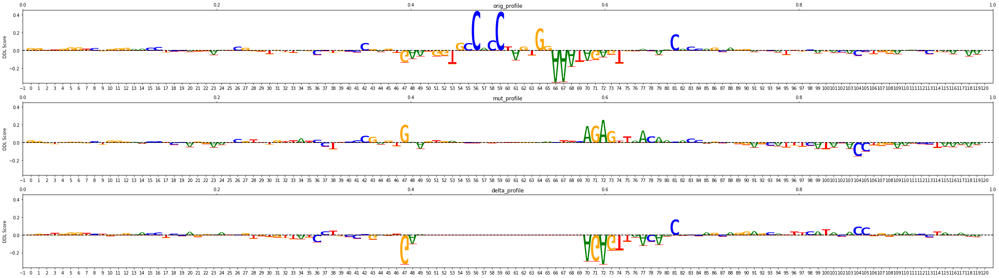

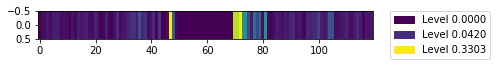

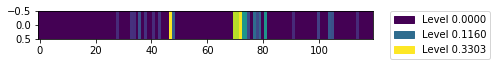

chr12:122119533-122120533;mut_122120135_to_122120155


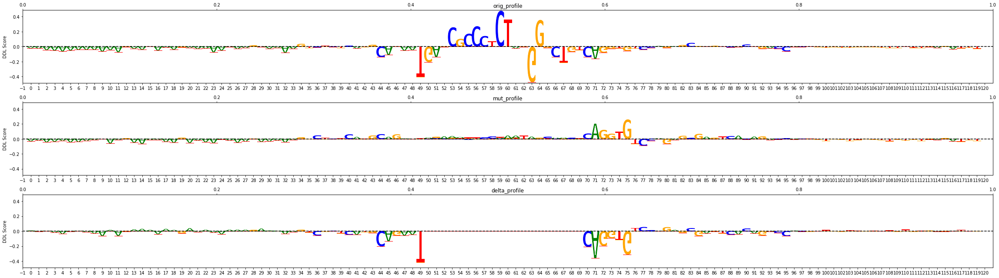

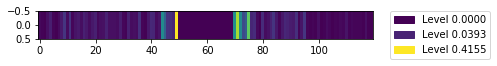

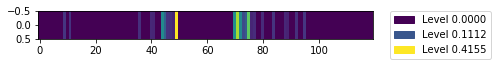

chr19:29124371-29125371;mut_29124818_to_29124838


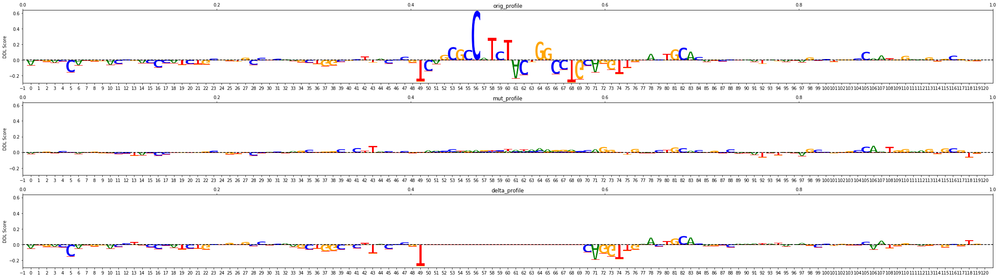

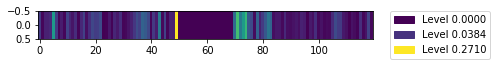

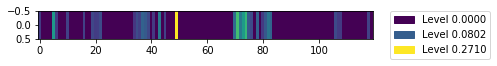

chr19:49894710-49895710;mut_49895313_to_49895333


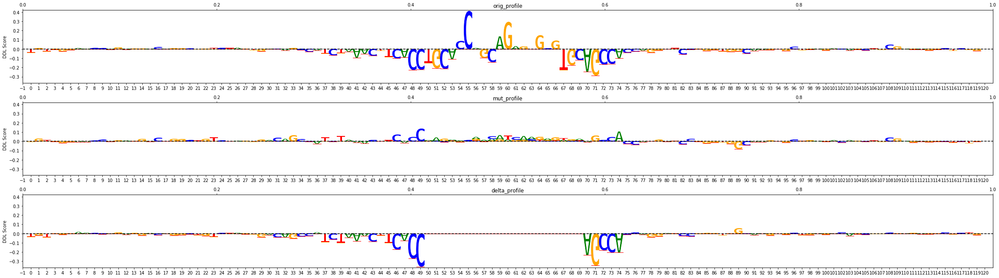

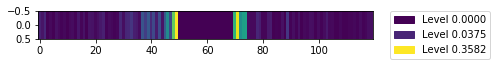

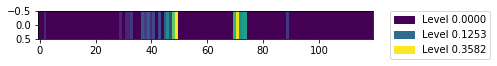

chrX:70398486-70399486;mut_70398967_to_70398987


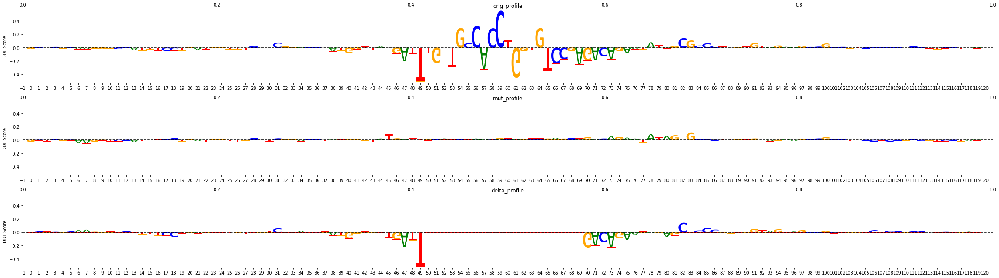

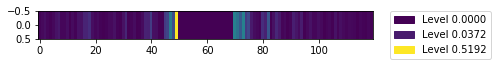

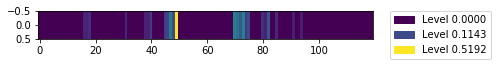

chr15:65610826-65611826;mut_65611290_to_65611310


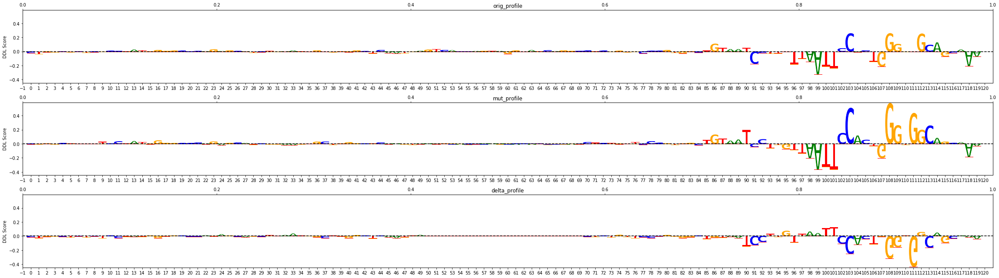

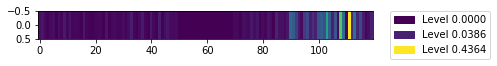

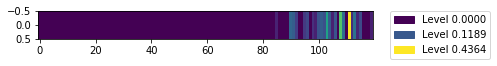

chr12:109058386-109059386;mut_109058762_to_109058782


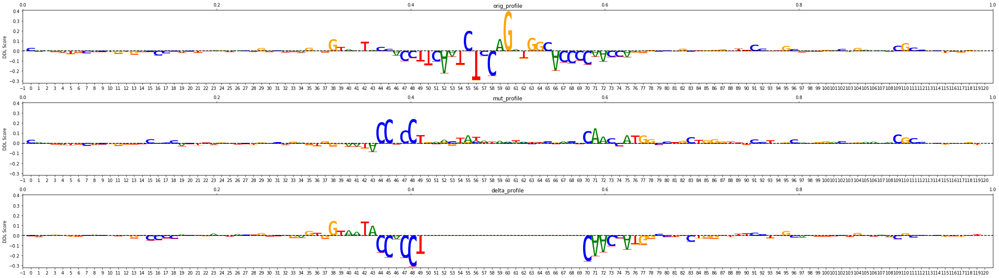

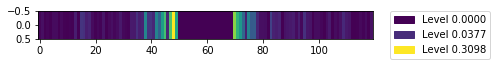

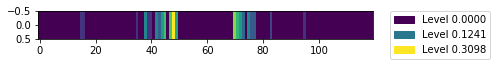

chr5:148520549-148521549;mut_148521023_to_148521043


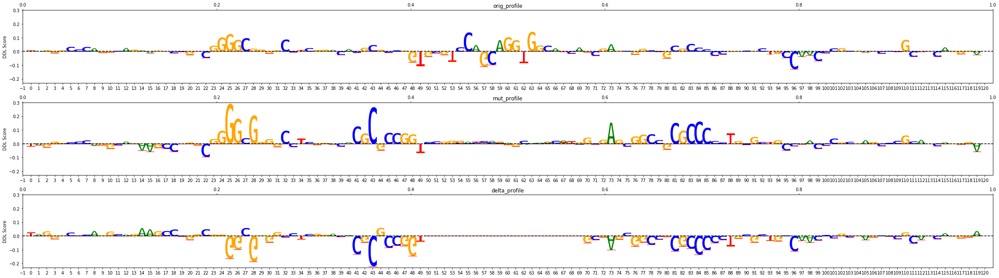

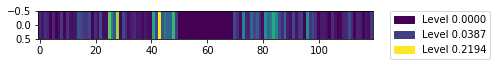

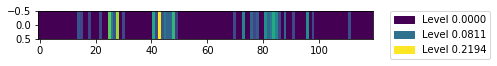

chr1:225662453-225663453;mut_225662787_to_225662807


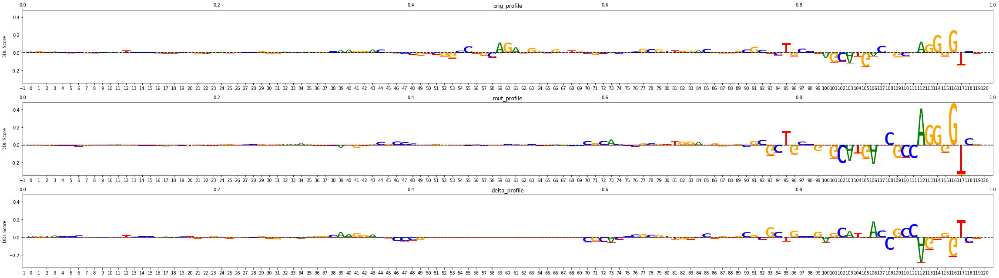

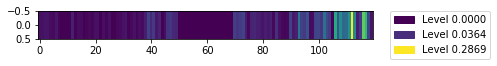

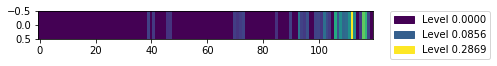

chr6:125191381-125192381;mut_125191943_to_125191963


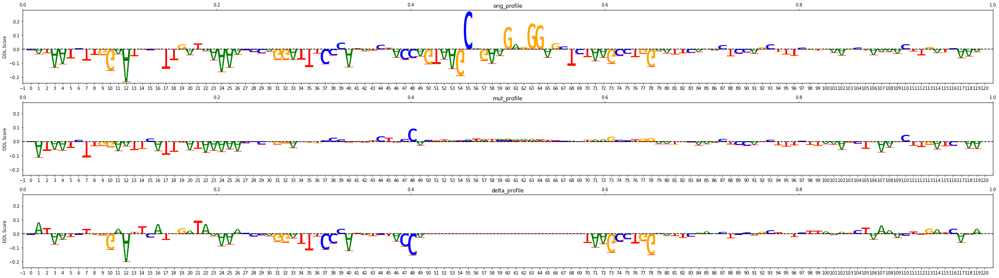

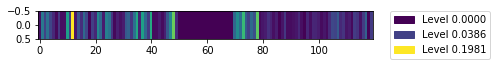

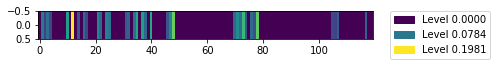

chr7:150595328-150596328;mut_150595735_to_150595755


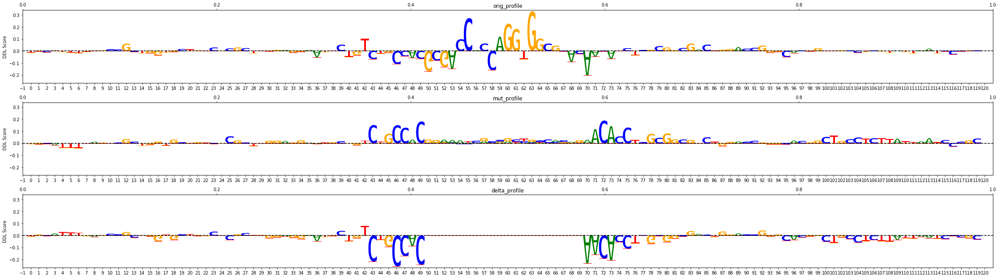

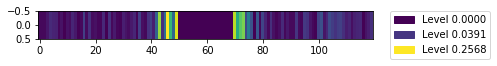

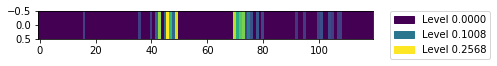

chr17:42942125-42943125;mut_42942690_to_42942710


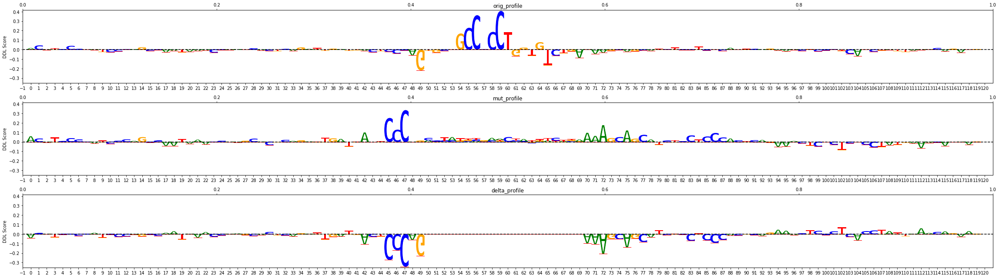

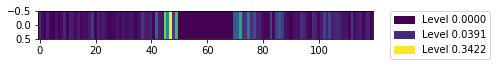

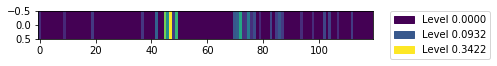

chr7:31527829-31528829;mut_31528397_to_31528417


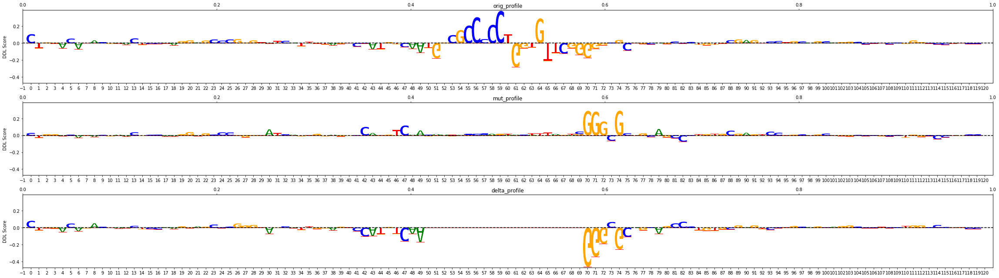

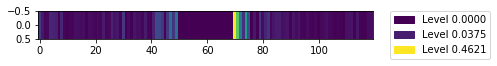

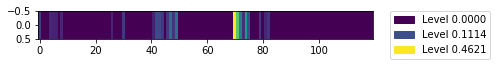

chr19:11770134-11771134;mut_11770615_to_11770635


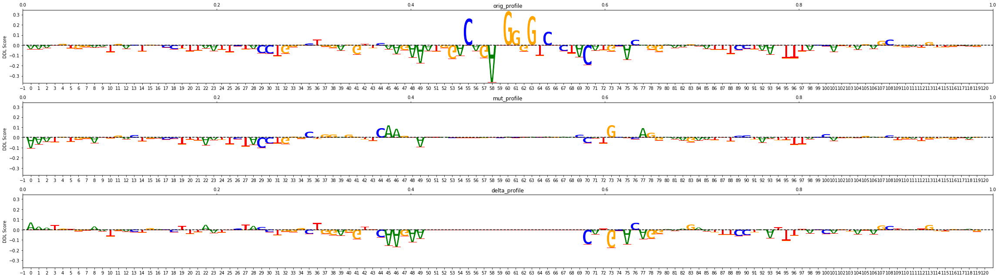

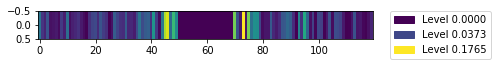

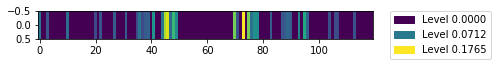

chr2:75630809-75631809;mut_75631260_to_75631280


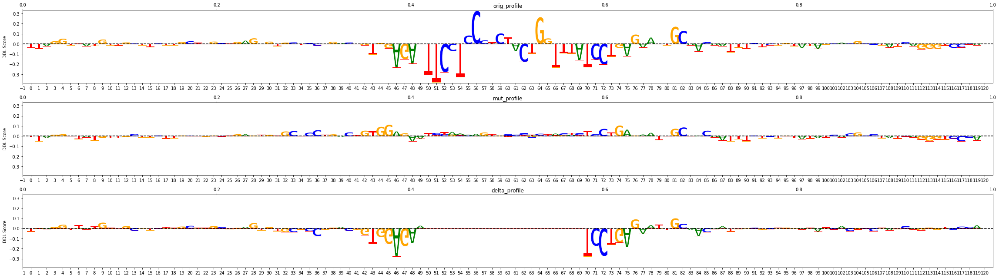

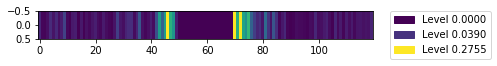

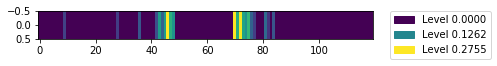

chr12:99047442-99048442;mut_99047866_to_99047886


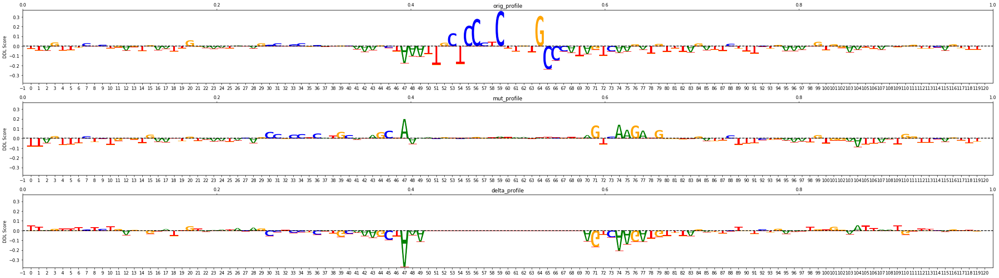

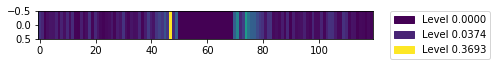

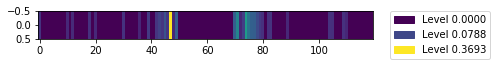

chr20:36162456-36163456;mut_36163000_to_36163020


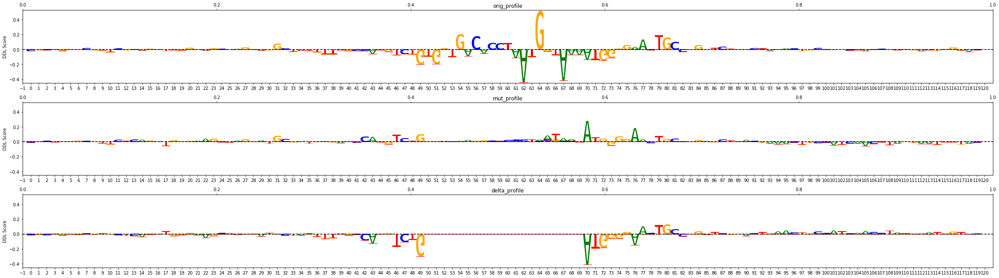

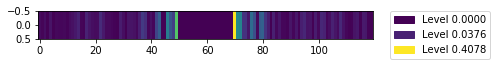

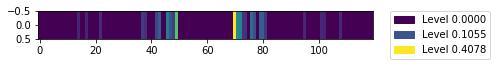

chr10:33297378-33298378;mut_33297824_to_33297844


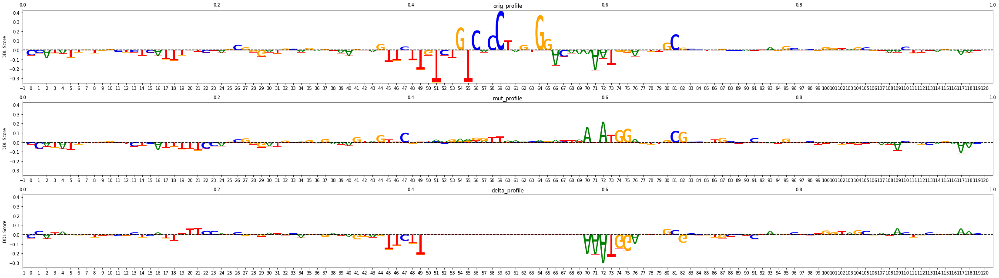

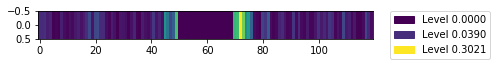

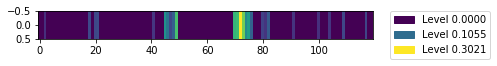

chr19:10616037-10617037;mut_10616445_to_10616464


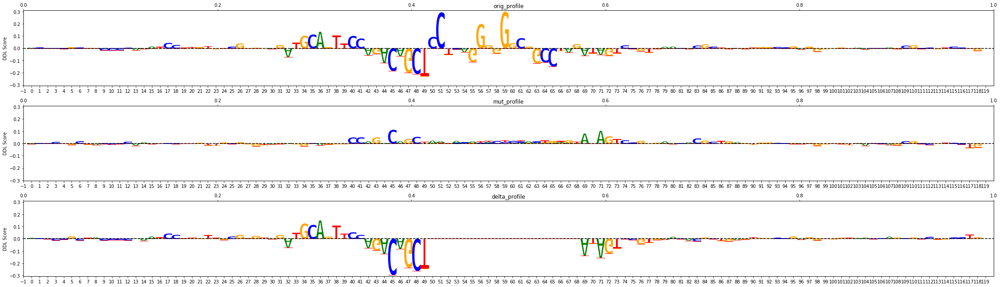

KeyboardInterrupt: 

In [19]:
%matplotlib inline  

# Capture the sequences that are QTLs
# Generate maps and plot
# Need a new plotting function

track_labels = ['orig_profile', 'mut_profile', 'delta_profile']
TOP_NUM = 100

reload(dfim.plot)

for (task, seq, mut) in [el[0] for el in top_rankings[0:TOP_NUM]]:
    print mutant_loc_dict['seq_%s'%seq]['mut_name']
    resp = delta_dict[task][seq][mut].keys()[0]
    track_list = [delta_dict[task][seq][mut][resp][track].T
                     for track in track_labels]
    dfim.plot.plot_delta_tracks(track_list, track_labels)
    plot_map = dfim_dict[task][seq][mut]
    null_mask = (dfim_pval_dict[task][seq][mut] <= 0.05)
    (plot_map * dfim_pval_dict[task][seq][mut]).shape
    width = track_list[0].shape[1]
    fig_width = 20 + width/10
    dfim.plot.plot_dfim(plot_map[None, :], figsize=(fig_width, 3*len(track_list)))
    dfim.plot.plot_dfim(plot_map[None, :] * null_mask[None, :])
